# HW 3 Optimization (80pts)

**Due 11:59pm, Apr 29th.**

## Please restart the kernel and run all before you submit !


## Your Name: Amay Jain

In [1]:
# import packages
import numpy as np
import matplotlib.pyplot as plt
import time

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Exercise 1: SGD with arbitrary batch size  (50pts)

**The goal of this exercise is to implement SGD with arbitrary batch size for a certain linear regression model.** 

Given data points $(x^i,y^i)_{i=1}^m$ where each data point $x$ has three features/attributes, i.e. $x=(x_1,x_2,x_3)$, we consider the following linear regression model
$$ y =  a_0 + a_1x_1 + a_2x_2 + a_3x_3.$$

Here, $a_0,a_1,a_2,a_3$ are coefficients. 

The corresponding optimization problem is 

$$ \mathop{\mathrm{Loss}}(a_0,a_1,a_2,a_3) = \frac{1}{m}\sum_{i=1}^{m} (a_0+a_1x_1^i+a_2x_2^i+a_3x_3^i-y^i)^2 $$


You should do the following three things:

1. Write a python function to implement SGD with arbitrary batch_size. Hint: you can write it as a python function and treat batch size as a function input.

2. Select at least 4 batch sizes and fix number of iteration, then run SGD for different stepsize, report the the running time for each batch size (use `print`). What is your conclusion?

3. Use the same batch sizes as part 2, then draw a plot to visualize the the loss after each iteration vs iterations. What is your conclusion?

Requirements:

1. Your SGD algorithm should allow different batch size. 

2. Write python functions to do 2 and 3.

3. Detailed docustring is required for each function. Add necessary inline comments and markdown to explain your code or make comments.

Grading is based on the codes (15 pts), function docstrings (10 pts), comments (10 pts) and conclusions (15 pts).

In [2]:
# run this cell to generate data points
m = 1000                                # number of data points
n = 3                                   # number of features
x = np.random.randn(m, n)               # each row of x represents a data point
theta = np.random.randn(n, 1)           # true coefficients a_1, a_2, a_3
y = x@theta + 3 + np.random.rand(m, 1)  # observations and true a_0 = 3

In [3]:
# Your code here

def SGD(a, eta, batchsize):

    a0, a1, a2, a3 = a[0], a[1], a[2], a[3]
    
    j = np.random.choice(m, batchsize)

    copy_x = x[j]
    copy_y = y[j].reshape(batchsize)

    x1 = copy_x[:, 0]
    x2 = copy_x[:, 1]
    x3 = copy_x[:, 2]

    grad_a0 = sum(2 * (a0 + a1*x1 + a2*x2 + a3*x3 - copy_y)) / batchsize
    grad_a1 = sum(2 * (a0 + a1*x1 + a2*x2 + a3*x3 - copy_y) * x1) / batchsize
    grad_a2 = sum(2 * (a0 + a1*x1 + a2*x2 + a3*x3 - copy_y) * x2) / batchsize
    grad_a3 = sum(2 * (a0 + a1*x1 + a2*x2 + a3*x3 - copy_y) * x3) / batchsize

    return [a0 - eta*grad_a0, 
            a1 - eta*grad_a1, 
            a2 - eta*grad_a2, 
            a3 - eta*grad_a3]

def running_time(batchsizes, stepsizes, fixed_batchsize = 50, fixed_stepsize = 0.01, iterations = 500):

    print('Changing batchsizes:\n')
    
    for batchsize in batchsizes:
        
        # initial coefficient values
        a = [10, 10, 10, 10]
        
        start = time.time()
        
        for i in range(iterations + 1):
            a = SGD(a, fixed_stepsize, batchsize)
            
        stop = time.time()
        
        print(f"For batchsize = {batchsize} and stepsize = {fixed_stepsize}, the computational time is {stop - start} seconds.\n")

    print('\n')
        
    print('Changing stepsizes:\n')
    
    for stepsize in stepsizes:
        
        # initial coefficient values
        a = [10, 10, 10, 10]
        
        start = time.time()
        
        for i in range(iterations + 1):
            a = SGD(a, stepsize, fixed_batchsize)
            
        stop = time.time()
        
        print(f"For batchsize = {fixed_batchsize} and stepsize = {stepsize}, the computational time is {stop - start} seconds.\n")

In [4]:
def plotter(batchsizes, fixed_stepsize = 0.01, iterations = 500):

    fig, ax = plt.subplots(2, 2, sharey = False, figsize = (20, 12))

    x1 = x[:, 0]
    x2 = x[:, 1]
    x3 = x[:, 2]

    copy_y = y.reshape(m)

    for j in range(4):

        # initial coefficient values
        a = [10, 10, 10, 10]
        
        losses = []

        for i in range(iterations + 1):
    
            a = SGD(a, 0.01, batchsizes[j])
            
            L = sum((a[0] + a[1]*x1 + a[2]*x2 + a[3]*x3 - copy_y)**2) / m
            
            losses.append(L)

        if j < 2:

            ax[0, j].plot(range(iterations + 1), losses)

            ax[0, j].set_title(f'Loss for batchsize = {batchsizes[j]}')

        else:

            ax[1, j - 2].plot(range(iterations + 1), losses)

            ax[1, j - 2].set_title(f'Loss for batchsize = {batchsizes[j]}')

            

            

In [5]:
# initialize arbitrary batch and step sizes
batchsizes = [50, 250, 600, 850]

stepsizes = [0.05, 0.1, 0.2, 0.4]

In [6]:
running_time(batchsizes = batchsizes, stepsizes = stepsizes)

Changing batchsizes:

For batchsize = 50 and stepsize = 0.01, the computational time is 0.050203800201416016 seconds.

For batchsize = 250 and stepsize = 0.01, the computational time is 0.0951077938079834 seconds.

For batchsize = 600 and stepsize = 0.01, the computational time is 0.18440890312194824 seconds.

For batchsize = 850 and stepsize = 0.01, the computational time is 0.24170613288879395 seconds.



Changing stepsizes:

For batchsize = 50 and stepsize = 0.05, the computational time is 0.044425249099731445 seconds.

For batchsize = 50 and stepsize = 0.1, the computational time is 0.044055938720703125 seconds.

For batchsize = 50 and stepsize = 0.2, the computational time is 0.043843984603881836 seconds.

For batchsize = 50 and stepsize = 0.4, the computational time is 0.04378700256347656 seconds.



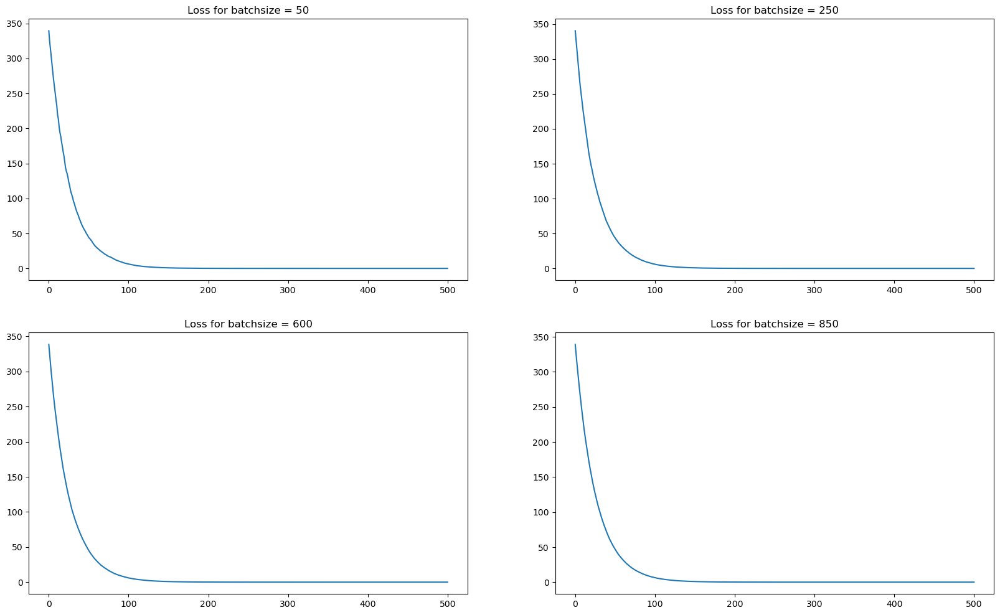

In [7]:
plotter(batchsizes = batchsizes)

# Your explanation on the relation between batch size and number of iterations. (please change this cell to markdown)

As the batchsize increases, it takes more time for the SGD algorithm to work, which makes sense as there are more points that have to be accounted for in the calculations of the gradients.

Looking at the losses for different batchsizes, they all seem to approach 0 at around the 100th iteration.

# Exercise 2: SGD animation for polynomial regression (30 pts)

In this exercise, our goal is to create a similar animation (which is available [here](https://nbviewer.org/github/PhilChodrow/PIC16B/blob/master/lectures/math/optimization.ipynb)) for polynomial regression model.  


#### Comments:
You cannot copy the code in the link directly because 

1. the sample code is for simple linear regression only, but we are considering polynomial regression.

2. the data generating process is included in the class initialization, however training data are provided in this exercise.

Please understand the sample code first, and then modify it accordingly. It is also fine if you do not write a class (class is used in the sample code) to do the animation.

#### Grading policy:
1. There is no error in your code.
2. The animation result looks reasonable.
3. Docstring and comments are required for your code.


#### Mathematics on polynomial regression:
Given data points $(x_i,y_i)_{i=1}^m$, polynomial regression is considered if we believe that the true relation between input $x$ and output $y$ can be described by a polynomial $y=a_0+a_1x+\cdots+a_nx^n$ for some degree $n$.

The goal is to find coefficients $a_0,\cdots,a_n$ by minimizing the loss function
$$ \mathop{\mathrm{minimize}}_{a_o,\cdots,a_n} \frac{1}{m}\sum_{i=1}^m (a_0+a_1x_i+\cdots+a_nx_i^n-y_i)^2 $$

Then we can use SGD to solve this optimization problem.

#### Data Generation

Please run the following code to generate the data points.

In [8]:
import numpy as np

# number of observations
m = 100
# generate input x 
X = np.random.uniform(0, 3, m)
X.sort()
# generate output y
y = -2 - 2*X + X**2 + 0.1*np.random.randn(m)

In [9]:
class UpdatePlot:
    """
    An update class for a polynomial regression stochastic gradient descent (SGD) animation. 
    Takes instance variables corresponding to plot objects, parameters and estimates, and animation controls. 
    Calling the class updates the plot. 
    
    ax: array of 2 axes on which to plot
    a0, a1, a2: floats, true parameters of polynomial regression
    a0_, a1_, a2_: floats, initial estimates of the true parameters
    eps: float, learning rate
    m: int, number of data points
    """
    
    def __init__(self, ax, a0, a1, a2, a0_, a1_, a2_, m, X, y, eps = 0.01):
        
        # store the axes on which to plot
        self.ax0 = ax[0]
        self.ax1 = ax[1]
        
        # true coefficients
        self.a0 = a0
        self.a1 = a1
        self.a2 = a2
        
        # initial coefficient estimates
        self.a0_ = a0_
        self.a1_ = a1_
        self.a2_ = a2_
        
        # number of data points
        self.m = m
        
        # create data
        self.X = X
        self.y = y
        
        # used for plotting lines
        self.x_space = np.linspace(0, 3, 100)
        
        # show data on lefthand plot
        self.ax0.scatter(self.X, self.y, color = "grey", s = 4, zorder = 100)
        
        # prepare animation variables
        self.point = self.ax0.scatter([], [], color = "red", zorder = 200)
        self.line, = self.ax0.plot([], [], 'k-')
        self.loss, = self.ax1.plot([], [], 'k-')
        
        # learning rate
        self.eps = eps
        
        # timesteps and value of loss function
        self.t = []
        self.L = []
        
    def __call__(self, i):
        """
        makes the class callable, resulting in plot updates
        each call performs a single step of SGD and returns
        appropriate artists. i represents the algorithm 
        timestep/animation frame. 
        """
        
        # pick a random point
        j = np.random.randint(self.m)      
        x, y = self.X[j], self.y[j]
        
        # update estimates with gradient of loss function evaluated 
        # at that point with respect to the coefficients
        # "this is the math"
        self.a0_ -= self.eps*2*(self.a0_ + self.a1_*x + self.a2_*(x)**2 - y)
        self.a1_ -= self.eps*2*(self.a0_ + self.a1_*x + self.a2_*(x)**2 - y)*x
        self.a2_ -= self.eps*2*(self.a0_ + self.a1_*x + self.a2_*(x)**2 - y)*(x**2)
        
        # evaluate loss function 
        # "this is the other math"
        L = sum((self.a0_ + self.a1_*self.X + self.a2_*(self.X)**2 - self.y)**2) / self.m
        
        # update lefthand plot with highlight point and new regression line
        self.point.set_offsets([[x, y]])
        self.line.set_data(self.x_space, self.a0_ + self.a1_*self.x_space + self.a2_*(self.x_space)**2)
        
        # update timestep and loss function
        self.t.append(i)
        self.L.append(L)
        
        # plot loss function
        self.loss.set_data(self.t, self.L)
        
        # return artists
        return [self.point, self.line, self.loss]

In [10]:
# number of algorithm iterations
n_steps = 500

# create plotting background
fig, ax = plt.subplots(1, 2, figsize = (7, 3))

ax[0].set_xlim(-1, 4)
ax[0].set_ylim(-4, 2)

ax[1].set_xlim(0, n_steps)
ax[1].set_ylim(0, 10)
ax[1].grid(True)

ax[0].set(title = "Regression Problem", 
          xlabel = r"$x$",
          ylabel = r"$y$")

ax[1].set(title = "Current Loss",
          xlabel = "Iteration",
          ylabel = r"$\mathcal{L}$")

plt.tight_layout()

# create the plot updater
# assuming initial coefficients are all 0
ud = UpdatePlot(ax, -2, -2, 1, 0, 0, 0, m, X, y)
anim = FuncAnimation(fig, ud, frames = n_steps, interval = 200, blit = True)

# to interactively display in notebook
plt.close() # prevents plot from showing twice
HTML(anim.to_jshtml()) 